In [1]:
#Import Libraries
import numpy as np
import pandas as pd
from pandas_profiling import ProfileReport
import matplotlib.pyplot as plt
import seaborn as sns
import locale
from datetime import datetime
%matplotlib inline

import statsmodels.tsa.api as smt
import statsmodels.api as sm
import warnings
import math
from scipy.stats import variation

## Analysing Data

In [2]:
#Load Dataset
df = pd.read_csv('/home/forhad/Study/Self_Work/shazad/EDA/Stainless-Steel-Prices-Forecasty-Assignment.csv')

In [3]:
df.head()

,Date,StainlessSteelPrice,Steel_Inventory_M_USD,Steel_Orders_M_USD,IronOre_Global_USD,CoalAustralia_Global_USD,Energy_Index,Nickel_Global_USD,Zinc_Global_USD,Freight_Transport_Index,WTI_Crude_Global_USD,Baltic_Dry_Index,BCI_China,BCI_Europe,BCI_US,CLI_China,CLI_Europe,CLI_US,PMI_US_Manufacturing,Copper_Global_USD
0,07-01-2013,0.827352,20575,10568,127.191304,82.222360,227.022942,13750.31522,1837.619565,-0.4,104.545217,1062,98.80018,99.64265,100.1044,101.1423,99.43615,100.6230,50.9,6906.64
1,08-01-2013,0.760221,20609,10821,137.055000,82.221429,232.234194,14308.26190,1896.392857,0.5,106.546364,1132,99.04874,99.91766,100.3962,101.1938,99.64082,100.6545,55.4,7186.25
2,09-01-2013,0.784715,20761,10774,134.185714,83.295918,234.335594,13801.39286,1846.880952,0.1,106.313810,2003,99.27196,100.18490,100.5363,101.2066,99.84383,100.6646,55.7,7159.27
3,10-01-2013,0.769293,20735,11291,132.572727,85.443634,229.393932,14117.65217,1884.836957,-0.1,100.500435,1504,99.40488,100.36330,100.5771,101.1835,100.02300,100.6666,56.2,7203.02
4,11-01-2013,0.750242,20854,11559,136.323810,88.363265,225.437049,13684.01190,1866.416667,2.1,93.812381,1821,99.36221,100.49830,100.5459,101.1283,100.17150,100.6744,56.4,7070.65


In [4]:
df.shape

(84, 20)

In [5]:
df.columns

Index(['Date', 'StainlessSteelPrice', 'Steel_Inventory_M_USD',
       'Steel_Orders_M_USD', 'IronOre_Global_USD', 'CoalAustralia_Global_USD',
       'Energy_Index', 'Nickel_Global_USD', 'Zinc_Global_USD',
       'Freight_Transport_Index', 'WTI_Crude_Global_USD', 'Baltic_Dry_Index',
       'BCI_China', 'BCI_Europe', 'BCI_US', 'CLI_China', 'CLI_Europe',
       'CLI_US', 'PMI_US_Manufacturing', 'Copper_Global_USD '],
      dtype='object')

In [6]:
df.dtypes

Date                         object
StainlessSteelPrice         float64
Steel_Inventory_M_USD         int64
Steel_Orders_M_USD            int64
IronOre_Global_USD          float64
CoalAustralia_Global_USD    float64
Energy_Index                float64
Nickel_Global_USD           float64
Zinc_Global_USD             float64
Freight_Transport_Index     float64
WTI_Crude_Global_USD        float64
Baltic_Dry_Index              int64
BCI_China                   float64
BCI_Europe                  float64
BCI_US                      float64
CLI_China                   float64
CLI_Europe                  float64
CLI_US                      float64
PMI_US_Manufacturing        float64
Copper_Global_USD           float64
dtype: object

## EDA (through pandas profiling)

In [7]:
#To Create the Simple report quickly
profile = ProfileReport(df, title='Pandas Profiling Report', explorative=True)

In [8]:
#Display Reports
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## TIME SERIES EXPLORATORY DATA ANALYSIS (in detail)

In [9]:
#Statistical Analysis
df.describe()

,StainlessSteelPrice,Steel_Inventory_M_USD,Steel_Orders_M_USD,IronOre_Global_USD,CoalAustralia_Global_USD,Energy_Index,Nickel_Global_USD,Zinc_Global_USD,Freight_Transport_Index,WTI_Crude_Global_USD,Baltic_Dry_Index,BCI_China,BCI_Europe,BCI_US,CLI_China,CLI_Europe,CLI_US,PMI_US_Manufacturing,Copper_Global_USD
count,84.000000,84.000000,84.000000,84.000000,84.000000,84.000000,84.000000,84.000000,84.000000,84.000000,84.000000,84.000000,84.000000,84.000000,84.000000,84.000000,84.000000,84.000000,84.000000
mean,0.810715,20070.559524,9831.595238,79.962940,81.844151,143.408951,12712.275477,2358.786301,0.122619,61.017507,1067.785714,98.710869,100.569427,100.175521,99.563679,100.023602,99.814380,54.026190,6037.075714
std,0.143444,1764.033210,1240.333905,23.874776,19.443360,47.136073,2694.729168,470.463900,1.230080,21.407539,443.697935,0.848983,1.123901,0.876723,2.027340,1.567463,1.367807,4.097578,783.645475
min,0.499859,16688.000000,7650.000000,40.882609,53.428929,52.771306,8298.500000,1520.362500,-7.100000,16.807273,317.000000,94.501530,95.996640,98.102130,85.383290,90.343960,92.280250,41.500000,4471.790000
25%,0.743778,18980.000000,8904.000000,61.484190,67.111352,111.607197,10578.975000,2021.262099,-0.425000,47.738636,699.500000,98.271312,100.427200,99.535877,99.225065,99.696710,99.278723,51.275000,5645.152500
50%,0.812157,20190.000000,9947.000000,74.280682,78.677679,131.088857,12721.351135,2287.054725,0.250000,54.912545,1058.500000,98.675055,100.562400,100.312350,99.854750,100.294100,100.030800,54.250000,6024.555000
75%,0.893690,21458.500000,11062.500000,92.409524,96.985695,163.923895,14105.350543,2658.296875,0.725000,68.464674,1354.500000,99.364373,101.040100,100.803675,100.518350,100.500175,100.679550,57.400000,6801.285000
max,1.075014,23464.000000,11825.000000,137.055000,125.085877,237.208789,19401.075000,3532.900000,2.100000,106.546364,2378.000000,99.923670,102.323700,101.573800,101.206600,101.709300,100.968000,60.800000,7291.470000


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 84 entries, 0 to 83
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Date                      84 non-null     object 
 1   StainlessSteelPrice       84 non-null     float64
 2   Steel_Inventory_M_USD     84 non-null     int64  
 3   Steel_Orders_M_USD        84 non-null     int64  
 4   IronOre_Global_USD        84 non-null     float64
 5   CoalAustralia_Global_USD  84 non-null     float64
 6   Energy_Index              84 non-null     float64
 7   Nickel_Global_USD         84 non-null     float64
 8   Zinc_Global_USD           84 non-null     float64
 9   Freight_Transport_Index   84 non-null     float64
 10  WTI_Crude_Global_USD      84 non-null     float64
 11  Baltic_Dry_Index          84 non-null     int64  
 12  BCI_China                 84 non-null     float64
 13  BCI_Europe                84 non-null     float64
 14  BCI_US      

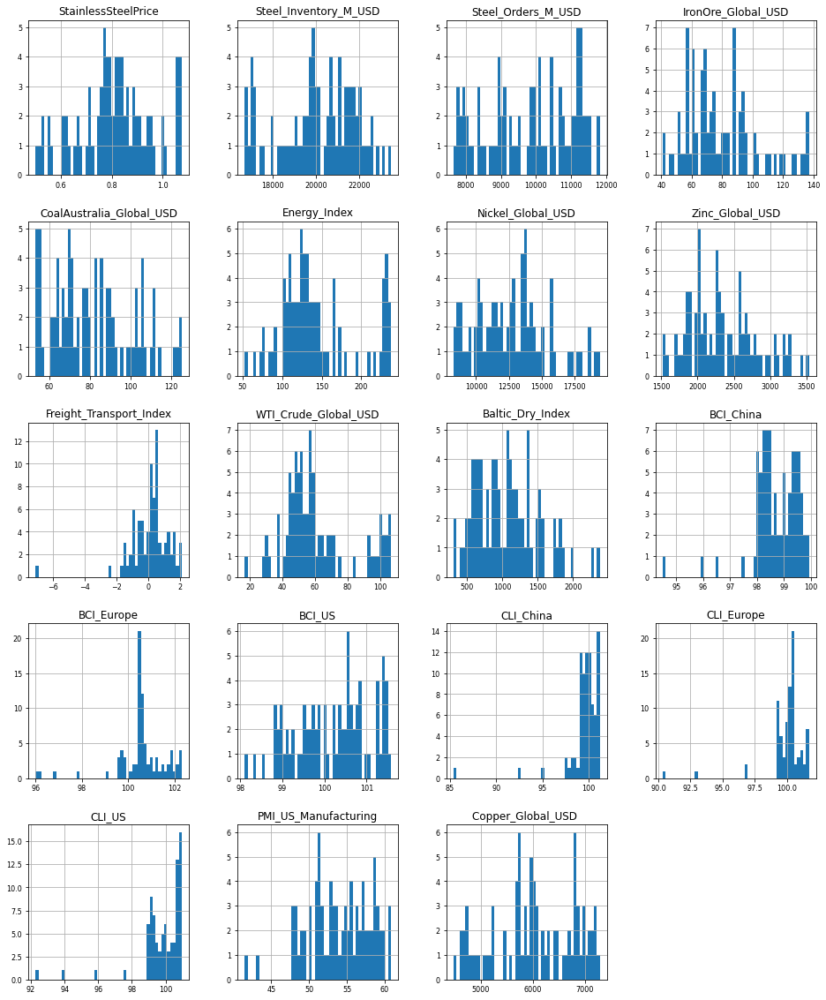

In [11]:
#Plotting Histogram
df.hist(figsize=(16, 20), bins=50, xlabelsize=8, ylabelsize=8);

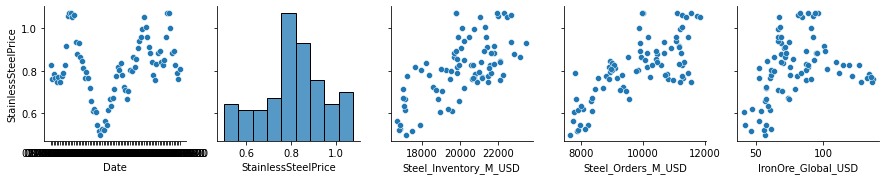

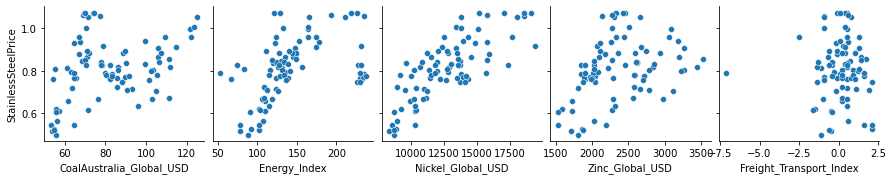

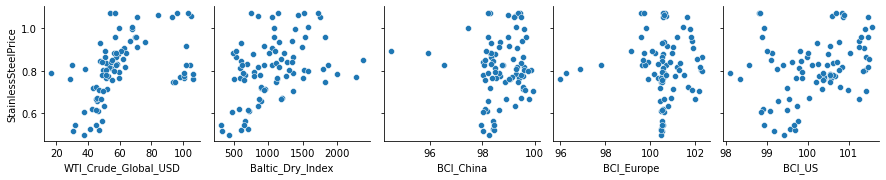

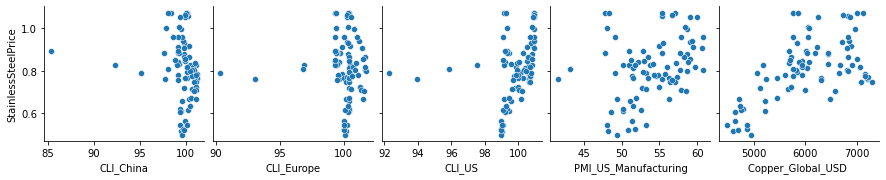

In [12]:
#Plotting graghs according to target value
for i in range(0, len(df.columns), 5):
    sns.pairplot(data=df,
                x_vars=df.columns[i:i+5],
                y_vars=['StainlessSteelPrice'])

- CORRELATION

In [13]:
#Strong Correlation with Target value
corr = df.corr()['StainlessSteelPrice'][:-1] # -1 because the latest row is StainlessSteel
features_list = corr[abs(corr) > 0.5].sort_values(ascending=False)
print("There is {} strongly correlated values with StainlessSteelPrice:\n{}".format(len(features_list), features_list))

There is 4 strongly correlated values with StainlessSteelPrice:
StainlessSteelPrice      1.000000
Nickel_Global_USD        0.778973
Steel_Orders_M_USD       0.740649
Steel_Inventory_M_USD    0.664614
Name: StainlessSteelPrice, dtype: float64


In [14]:
#Correlation
corr = df.corr()
corr['StainlessSteelPrice'].sort_values(ascending=False)

StainlessSteelPrice         1.000000
Nickel_Global_USD           0.778973
Steel_Orders_M_USD          0.740649
Steel_Inventory_M_USD       0.664614
Copper_Global_USD           0.598440
Energy_Index                0.462810
WTI_Crude_Global_USD        0.456958
Baltic_Dry_Index            0.412468
Zinc_Global_USD             0.362059
PMI_US_Manufacturing        0.347954
CoalAustralia_Global_USD    0.342556
BCI_US                      0.328395
IronOre_Global_USD          0.309481
CLI_US                      0.300326
BCI_China                   0.062889
BCI_Europe                  0.014029
CLI_Europe                 -0.012130
Freight_Transport_Index    -0.016143
CLI_China                  -0.163732
Name: StainlessSteelPrice, dtype: float64

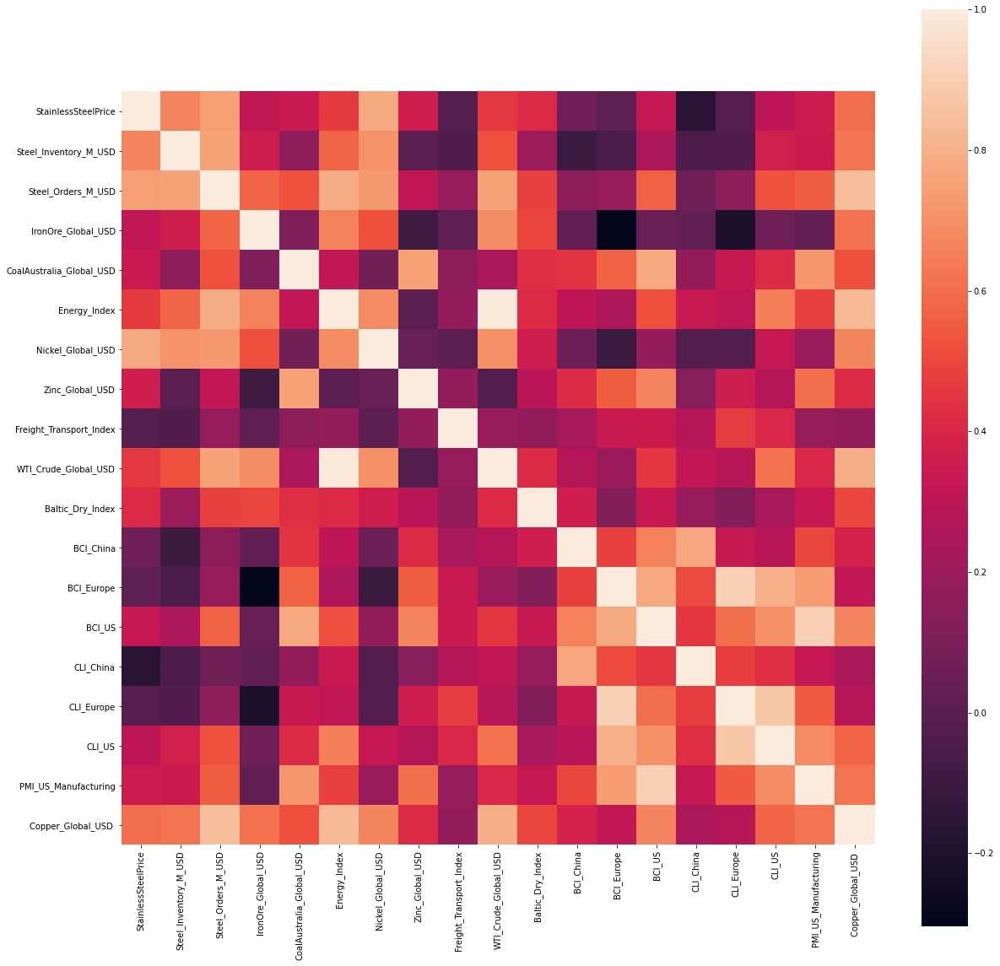

In [15]:
#Plotting Heatmap
fig = plt.figure(figsize = (20, 20))
sns.heatmap(corr, square=True)
plt.show()

In [16]:
#Format Date
df.Date = pd.to_datetime(df.Date, format='%d-%m-%Y')
df

,Date,StainlessSteelPrice,Steel_Inventory_M_USD,Steel_Orders_M_USD,IronOre_Global_USD,CoalAustralia_Global_USD,Energy_Index,Nickel_Global_USD,Zinc_Global_USD,Freight_Transport_Index,WTI_Crude_Global_USD,Baltic_Dry_Index,BCI_China,BCI_Europe,BCI_US,CLI_China,CLI_Europe,CLI_US,PMI_US_Manufacturing,Copper_Global_USD
0,2013-01-07,0.827352,20575,10568,127.191304,82.222360,227.022942,13750.31522,1837.619565,-0.4,104.545217,1062,98.80018,99.64265,100.10440,101.14230,99.43615,100.62300,50.9,6906.64
1,2013-01-08,0.760221,20609,10821,137.055000,82.221429,232.234194,14308.26190,1896.392857,0.5,106.546364,1132,99.04874,99.91766,100.39620,101.19380,99.64082,100.65450,55.4,7186.25
2,2013-01-09,0.784715,20761,10774,134.185714,83.295918,234.335594,13801.39286,1846.880952,0.1,106.313810,2003,99.27196,100.18490,100.53630,101.20660,99.84383,100.66460,55.7,7159.27
3,2013-01-10,0.769293,20735,11291,132.572727,85.443634,229.393932,14117.65217,1884.836957,-0.1,100.500435,1504,99.40488,100.36330,100.57710,101.18350,100.02300,100.66660,56.2,7203.02
4,2013-01-11,0.750242,20854,11559,136.323810,88.363265,225.437049,13684.01190,1866.416667,2.1,93.812381,1821,99.36221,100.49830,100.54590,101.12830,100.17150,100.67440,56.4,7070.65
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79,2020-01-02,0.893123,19753,9914,87.625000,71.050179,110.312331,12715.55000,2113.237500,-0.6,50.601500,535,94.50153,99.15099,98.99674,85.38329,99.33393,99.23477,50.9,5687.75
80,2020-01-03,0.829167,19945,9072,88.659091,70.204870,73.684533,11846.22727,1903.625000,-0.6,29.877273,626,96.55129,97.81904,98.56776,92.34856,96.87456,97.54372,50.1,5182.63
81,2020-01-04,0.789704,19824,7800,83.750000,64.620000,52.771306,11804.00950,1903.367000,-7.1,16.807273,635,98.21212,96.24888,98.10213,95.14948,90.34396,92.28025,49.1,5057.97
82,2020-01-05,0.762035,19441,8908,91.333333,54.148308,66.915249,12179.60526,1975.322632,1.0,28.794762,504,99.01438,95.99664,98.35104,97.71723,93.02601,93.95093,41.5,5239.83


- Extract the year, month and day separately

In [17]:
df['year'] = df.Date.dt.year
df['month'] = df.Date.dt.month
df['day'] = df.Date.dt.day
df

,Date,StainlessSteelPrice,Steel_Inventory_M_USD,Steel_Orders_M_USD,IronOre_Global_USD,CoalAustralia_Global_USD,Energy_Index,Nickel_Global_USD,Zinc_Global_USD,Freight_Transport_Index,...,BCI_Europe,BCI_US,CLI_China,CLI_Europe,CLI_US,PMI_US_Manufacturing,Copper_Global_USD,year,month,day
0,2013-01-07,0.827352,20575,10568,127.191304,82.222360,227.022942,13750.31522,1837.619565,-0.4,...,99.64265,100.10440,101.14230,99.43615,100.62300,50.9,6906.64,2013,1,7
1,2013-01-08,0.760221,20609,10821,137.055000,82.221429,232.234194,14308.26190,1896.392857,0.5,...,99.91766,100.39620,101.19380,99.64082,100.65450,55.4,7186.25,2013,1,8
2,2013-01-09,0.784715,20761,10774,134.185714,83.295918,234.335594,13801.39286,1846.880952,0.1,...,100.18490,100.53630,101.20660,99.84383,100.66460,55.7,7159.27,2013,1,9
3,2013-01-10,0.769293,20735,11291,132.572727,85.443634,229.393932,14117.65217,1884.836957,-0.1,...,100.36330,100.57710,101.18350,100.02300,100.66660,56.2,7203.02,2013,1,10
4,2013-01-11,0.750242,20854,11559,136.323810,88.363265,225.437049,13684.01190,1866.416667,2.1,...,100.49830,100.54590,101.12830,100.17150,100.67440,56.4,7070.65,2013,1,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79,2020-01-02,0.893123,19753,9914,87.625000,71.050179,110.312331,12715.55000,2113.237500,-0.6,...,99.15099,98.99674,85.38329,99.33393,99.23477,50.9,5687.75,2020,1,2
80,2020-01-03,0.829167,19945,9072,88.659091,70.204870,73.684533,11846.22727,1903.625000,-0.6,...,97.81904,98.56776,92.34856,96.87456,97.54372,50.1,5182.63,2020,1,3
81,2020-01-04,0.789704,19824,7800,83.750000,64.620000,52.771306,11804.00950,1903.367000,-7.1,...,96.24888,98.10213,95.14948,90.34396,92.28025,49.1,5057.97,2020,1,4
82,2020-01-05,0.762035,19441,8908,91.333333,54.148308,66.915249,12179.60526,1975.322632,1.0,...,95.99664,98.35104,97.71723,93.02601,93.95093,41.5,5239.83,2020,1,5


In [18]:
#Set index as Date
df= df.set_index('Date')
df

,StainlessSteelPrice,Steel_Inventory_M_USD,Steel_Orders_M_USD,IronOre_Global_USD,CoalAustralia_Global_USD,Energy_Index,Nickel_Global_USD,Zinc_Global_USD,Freight_Transport_Index,WTI_Crude_Global_USD,...,BCI_Europe,BCI_US,CLI_China,CLI_Europe,CLI_US,PMI_US_Manufacturing,Copper_Global_USD,year,month,day
Date,,,,,,,,,,,,,,,,,,,,,
2013-01-07,0.827352,20575,10568,127.191304,82.222360,227.022942,13750.31522,1837.619565,-0.4,104.545217,...,99.64265,100.10440,101.14230,99.43615,100.62300,50.9,6906.64,2013,1,7
2013-01-08,0.760221,20609,10821,137.055000,82.221429,232.234194,14308.26190,1896.392857,0.5,106.546364,...,99.91766,100.39620,101.19380,99.64082,100.65450,55.4,7186.25,2013,1,8
2013-01-09,0.784715,20761,10774,134.185714,83.295918,234.335594,13801.39286,1846.880952,0.1,106.313810,...,100.18490,100.53630,101.20660,99.84383,100.66460,55.7,7159.27,2013,1,9
2013-01-10,0.769293,20735,11291,132.572727,85.443634,229.393932,14117.65217,1884.836957,-0.1,100.500435,...,100.36330,100.57710,101.18350,100.02300,100.66660,56.2,7203.02,2013,1,10
2013-01-11,0.750242,20854,11559,136.323810,88.363265,225.437049,13684.01190,1866.416667,2.1,93.812381,...,100.49830,100.54590,101.12830,100.17150,100.67440,56.4,7070.65,2013,1,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-01-02,0.893123,19753,9914,87.625000,71.050179,110.312331,12715.55000,2113.237500,-0.6,50.601500,...,99.15099,98.99674,85.38329,99.33393,99.23477,50.9,5687.75,2020,1,2
2020-01-03,0.829167,19945,9072,88.659091,70.204870,73.684533,11846.22727,1903.625000,-0.6,29.877273,...,97.81904,98.56776,92.34856,96.87456,97.54372,50.1,5182.63,2020,1,3
2020-01-04,0.789704,19824,7800,83.750000,64.620000,52.771306,11804.00950,1903.367000,-7.1,16.807273,...,96.24888,98.10213,95.14948,90.34396,92.28025,49.1,5057.97,2020,1,4


<AxesSubplot:xlabel='month'>

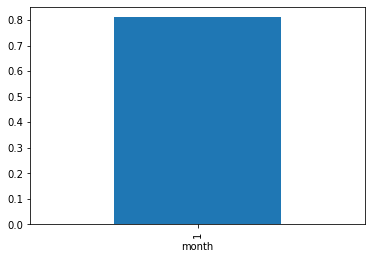

In [19]:
#Groupby according to month
df.groupby('month').StainlessSteelPrice.mean().plot.bar()

<AxesSubplot:xlabel='year'>

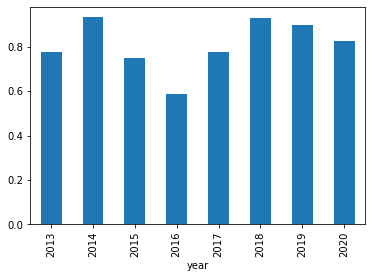

In [20]:
#Groupby according to year
df.groupby('year').StainlessSteelPrice.mean().plot.bar()

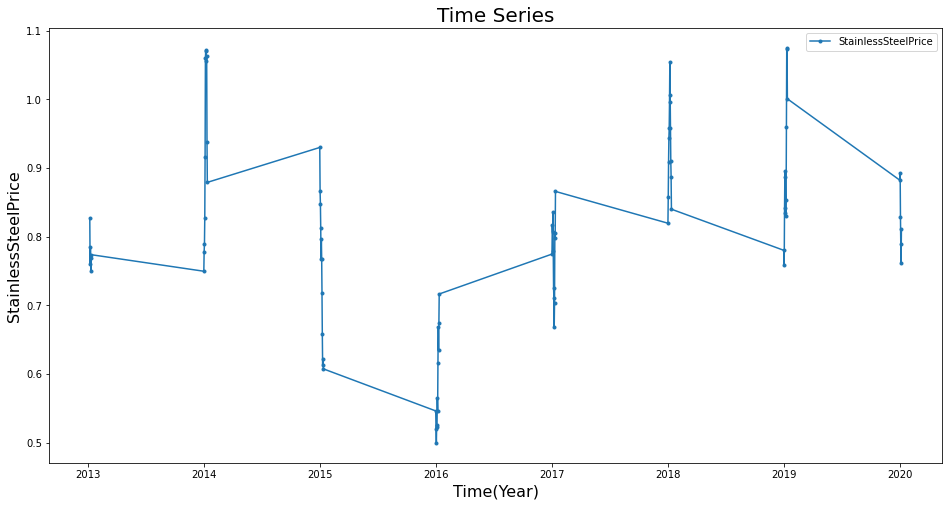

In [21]:
#Time Series Graph
plt.figure(figsize=(16,8))

plt.plot(df['StainlessSteelPrice'], ".-", label = 'StainlessSteelPrice')

plt.title('Time Series', fontsize=20)
plt.xlabel("Time(Year)", fontsize=16)
plt.ylabel("StainlessSteelPrice", fontsize=16)
plt.legend(loc = 'best')

- Since above graph looks bit noisy, aggregating and converting it in:
    1. Yearly 
    2. Monthly

In [22]:
# Yearly
yearly = df.resample('Y').sum()
yearly

,StainlessSteelPrice,Steel_Inventory_M_USD,Steel_Orders_M_USD,IronOre_Global_USD,CoalAustralia_Global_USD,Energy_Index,Nickel_Global_USD,Zinc_Global_USD,Freight_Transport_Index,WTI_Crude_Global_USD,...,BCI_Europe,BCI_US,CLI_China,CLI_Europe,CLI_US,PMI_US_Manufacturing,Copper_Global_USD,year,month,day
Date,,,,,,,,,,,,,,,,,,,,,
2013-12-31,4.665651,124692,65245,803.119032,510.991070,1381.905640,83586.184050,11307.121998,1.3,609.620479,...,601.14061,602.56320,606.88790,599.40510,603.95980,331.9,42740.73,12078,6,57
2014-12-31,11.196928,264606,134976,1168.645429,908.747777,2569.808754,202720.494570,25931.655284,4.4,1117.615250,...,1207.44650,1207.02620,1202.82678,1204.57060,1210.37750,671.2,82360.77,24168,12,78
2015-12-31,9.008798,250860,105297,673.649812,752.310632,1436.602391,142351.614242,23180.141636,-2.3,584.971821,...,1206.16730,1194.87370,1197.50769,1204.68860,1200.14484,623.9,66125.49,24180,12,78
2016-12-31,7.039300,204971,96035,702.782289,840.981677,1200.000000,115142.148976,25079.700433,3.4,518.715013,...,1207.46020,1195.36416,1200.06909,1202.02938,1189.67897,611.2,58414.77,24192,12,78
2017-12-31,9.291840,222829,112141,853.613693,1129.656952,1487.080105,124915.619343,34690.388085,6.9,611.090241,...,1221.02460,1212.11670,1210.31970,1215.14010,1201.34232,685.4,74039.28,24204,12,78
2018-12-31,11.141136,249950,132610,841.660851,1358.769424,1892.333365,157368.766670,35068.548344,3.0,777.424091,...,1218.87440,1215.83970,1193.46920,1207.71885,1208.54670,710.6,78357.59,24216,12,78
2019-12-31,10.788695,250379,124737,1123.490151,986.318835,1565.108704,166966.904310,30604.919970,-0.6,683.935851,...,1199.92800,1194.57802,1185.95805,1192.69889,1192.16128,621.5,72121.74,24228,12,78
2020-12-31,4.967744,117640,54813,549.925725,387.132286,513.512899,74779.407940,12275.573495,-5.8,222.097863,...,585.79025,592.38208,566.31064,575.73108,578.19650,282.5,32953.99,12120,6,21


In [23]:
#Monthly
monthly = df.resample('M').sum()
monthly

,StainlessSteelPrice,Steel_Inventory_M_USD,Steel_Orders_M_USD,IronOre_Global_USD,CoalAustralia_Global_USD,Energy_Index,Nickel_Global_USD,Zinc_Global_USD,Freight_Transport_Index,WTI_Crude_Global_USD,...,BCI_Europe,BCI_US,CLI_China,CLI_Europe,CLI_US,PMI_US_Manufacturing,Copper_Global_USD,year,month,day
Date,,,,,,,,,,,,,,,,,,,,,
2013-01-31,4.665651,124692,65245,803.119032,510.991070,1381.905640,83586.18405,11307.121998,1.3,609.620479,...,601.14061,602.56320,606.88790,599.40510,603.9598,331.9,42740.73,12078,6,57
2013-02-28,0.000000,0,0,0.000000,0.000000,0.000000,0.00000,0.000000,0.0,0.000000,...,0.00000,0.00000,0.00000,0.00000,0.0000,0.0,0.00,0,0,0
2013-03-31,0.000000,0,0,0.000000,0.000000,0.000000,0.00000,0.000000,0.0,0.000000,...,0.00000,0.00000,0.00000,0.00000,0.0000,0.0,0.00,0,0,0
2013-04-30,0.000000,0,0,0.000000,0.000000,0.000000,0.00000,0.000000,0.0,0.000000,...,0.00000,0.00000,0.00000,0.00000,0.0000,0.0,0.00,0,0,0
2013-05-31,0.000000,0,0,0.000000,0.000000,0.000000,0.00000,0.000000,0.0,0.000000,...,0.00000,0.00000,0.00000,0.00000,0.0000,0.0,0.00,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-09-30,0.000000,0,0,0.000000,0.000000,0.000000,0.00000,0.000000,0.0,0.000000,...,0.00000,0.00000,0.00000,0.00000,0.0000,0.0,0.00,0,0,0
2019-10-31,0.000000,0,0,0.000000,0.000000,0.000000,0.00000,0.000000,0.0,0.000000,...,0.00000,0.00000,0.00000,0.00000,0.0000,0.0,0.00,0,0,0
2019-11-30,0.000000,0,0,0.000000,0.000000,0.000000,0.00000,0.000000,0.0,0.000000,...,0.00000,0.00000,0.00000,0.00000,0.0000,0.0,0.00,0,0,0


In [24]:
warnings.filterwarnings("ignore")
start_date = datetime(2013,1,7)
end_date = datetime(2020,1,6)

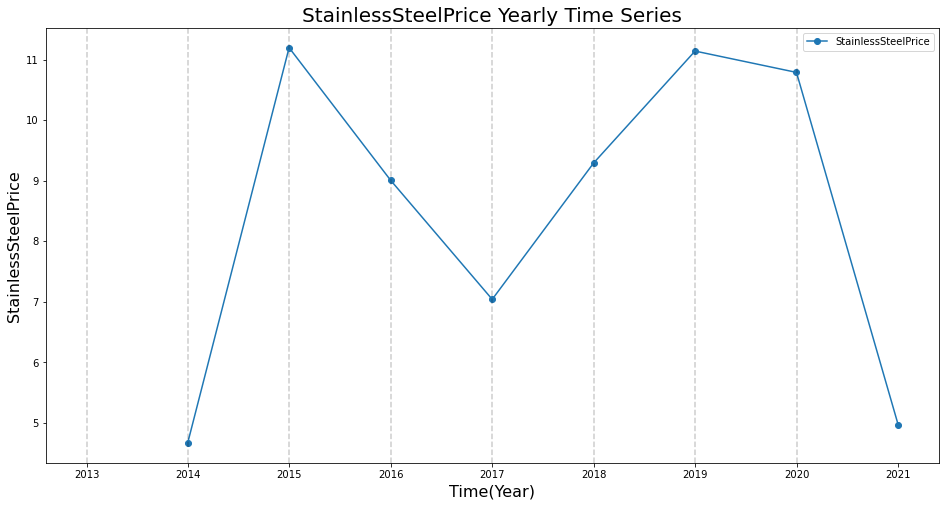

In [25]:
#Yearly Plot
plt.figure(figsize=(16,8))

plt.plot(yearly['StainlessSteelPrice'], "o-", label = 'StainlessSteelPrice')

plt.title('StainlessSteelPrice Yearly Time Series', fontsize=20)
plt.xlabel("Time(Year)", fontsize=16)
plt.ylabel("StainlessSteelPrice", fontsize=16)
plt.legend(loc = 'best')

for year in range(start_date.year,end_date.year+1):
   plt.axvline(pd.to_datetime(str(year)+'-01-01'), color='k', linestyle='--', alpha=0.2)

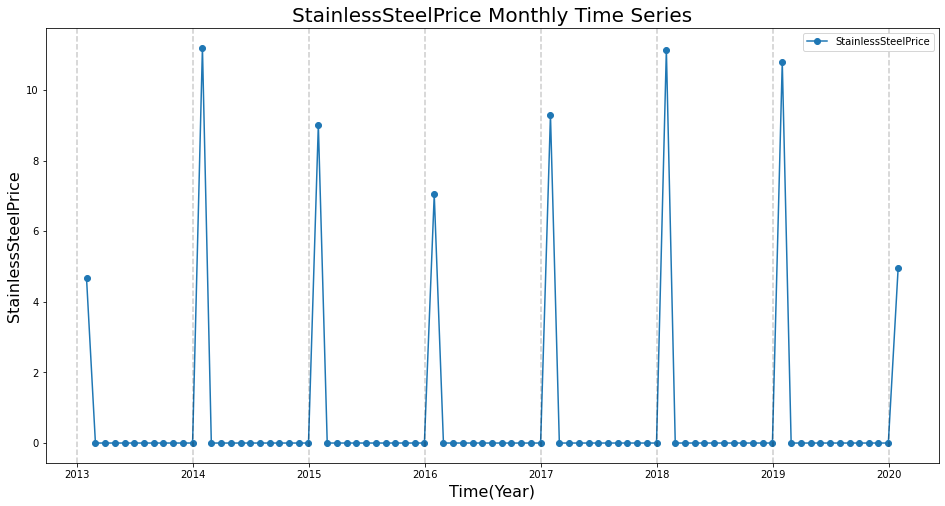

In [26]:
#Monthly Plot
plt.figure(figsize=(16,8))

plt.plot(monthly['StainlessSteelPrice'], "o-", label = 'StainlessSteelPrice')

plt.title('StainlessSteelPrice Monthly Time Series', fontsize=20)
plt.xlabel("Time(Year)", fontsize=16)
plt.ylabel("StainlessSteelPrice", fontsize=16)
plt.legend(loc = 'best')

for year in range(start_date.year,end_date.year+1):
   plt.axvline(pd.to_datetime(str(year)+'-01-01'), color='k', linestyle='--', alpha=0.2)

In [27]:
#For simplicity we limit the data
start_date = datetime(2013,1,1)
end_date = datetime(2020,1,1)

lim_data_year = yearly[start_date:end_date]
len(lim_data_year)

7

In [28]:
lim_data_year

,StainlessSteelPrice,Steel_Inventory_M_USD,Steel_Orders_M_USD,IronOre_Global_USD,CoalAustralia_Global_USD,Energy_Index,Nickel_Global_USD,Zinc_Global_USD,Freight_Transport_Index,WTI_Crude_Global_USD,...,BCI_Europe,BCI_US,CLI_China,CLI_Europe,CLI_US,PMI_US_Manufacturing,Copper_Global_USD,year,month,day
Date,,,,,,,,,,,,,,,,,,,,,
2013-12-31,4.665651,124692,65245,803.119032,510.991070,1381.905640,83586.184050,11307.121998,1.3,609.620479,...,601.14061,602.56320,606.88790,599.40510,603.95980,331.9,42740.73,12078,6,57
2014-12-31,11.196928,264606,134976,1168.645429,908.747777,2569.808754,202720.494570,25931.655284,4.4,1117.615250,...,1207.44650,1207.02620,1202.82678,1204.57060,1210.37750,671.2,82360.77,24168,12,78
2015-12-31,9.008798,250860,105297,673.649812,752.310632,1436.602391,142351.614242,23180.141636,-2.3,584.971821,...,1206.16730,1194.87370,1197.50769,1204.68860,1200.14484,623.9,66125.49,24180,12,78
2016-12-31,7.039300,204971,96035,702.782289,840.981677,1200.000000,115142.148976,25079.700433,3.4,518.715013,...,1207.46020,1195.36416,1200.06909,1202.02938,1189.67897,611.2,58414.77,24192,12,78
2017-12-31,9.291840,222829,112141,853.613693,1129.656952,1487.080105,124915.619343,34690.388085,6.9,611.090241,...,1221.02460,1212.11670,1210.31970,1215.14010,1201.34232,685.4,74039.28,24204,12,78
2018-12-31,11.141136,249950,132610,841.660851,1358.769424,1892.333365,157368.766670,35068.548344,3.0,777.424091,...,1218.87440,1215.83970,1193.46920,1207.71885,1208.54670,710.6,78357.59,24216,12,78
2019-12-31,10.788695,250379,124737,1123.490151,986.318835,1565.108704,166966.904310,30604.919970,-0.6,683.935851,...,1199.92800,1194.57802,1185.95805,1192.69889,1192.16128,621.5,72121.74,24228,12,78


In [29]:
lim_data_month = monthly[start_date:end_date]
len(lim_data_month)

84

In [30]:
lim_data_month

,StainlessSteelPrice,Steel_Inventory_M_USD,Steel_Orders_M_USD,IronOre_Global_USD,CoalAustralia_Global_USD,Energy_Index,Nickel_Global_USD,Zinc_Global_USD,Freight_Transport_Index,WTI_Crude_Global_USD,...,BCI_Europe,BCI_US,CLI_China,CLI_Europe,CLI_US,PMI_US_Manufacturing,Copper_Global_USD,year,month,day
Date,,,,,,,,,,,,,,,,,,,,,
2013-01-31,4.665651,124692,65245,803.119032,510.99107,1381.90564,83586.18405,11307.121998,1.3,609.620479,...,601.14061,602.5632,606.8879,599.4051,603.9598,331.9,42740.73,12078,6,57
2013-02-28,0.000000,0,0,0.000000,0.00000,0.00000,0.00000,0.000000,0.0,0.000000,...,0.00000,0.0000,0.0000,0.0000,0.0000,0.0,0.00,0,0,0
2013-03-31,0.000000,0,0,0.000000,0.00000,0.00000,0.00000,0.000000,0.0,0.000000,...,0.00000,0.0000,0.0000,0.0000,0.0000,0.0,0.00,0,0,0
2013-04-30,0.000000,0,0,0.000000,0.00000,0.00000,0.00000,0.000000,0.0,0.000000,...,0.00000,0.0000,0.0000,0.0000,0.0000,0.0,0.00,0,0,0
2013-05-31,0.000000,0,0,0.000000,0.00000,0.00000,0.00000,0.000000,0.0,0.000000,...,0.00000,0.0000,0.0000,0.0000,0.0000,0.0,0.00,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-08-31,0.000000,0,0,0.000000,0.00000,0.00000,0.00000,0.000000,0.0,0.000000,...,0.00000,0.0000,0.0000,0.0000,0.0000,0.0,0.00,0,0,0
2019-09-30,0.000000,0,0,0.000000,0.00000,0.00000,0.00000,0.000000,0.0,0.000000,...,0.00000,0.0000,0.0000,0.0000,0.0000,0.0,0.00,0,0,0
2019-10-31,0.000000,0,0,0.000000,0.00000,0.00000,0.00000,0.000000,0.0,0.000000,...,0.00000,0.0000,0.0000,0.0000,0.0000,0.0,0.00,0,0,0


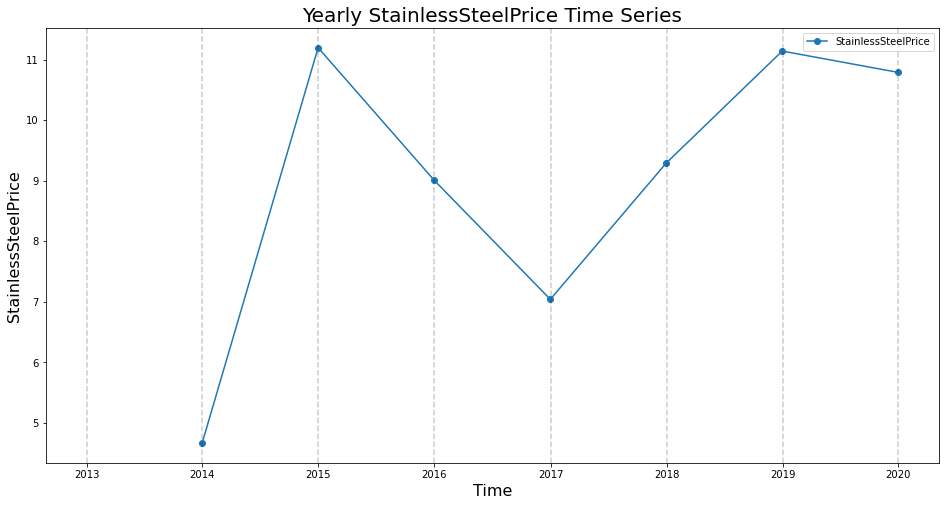

In [31]:
plt.figure(figsize=(16,8))

plt.plot(lim_data_year['StainlessSteelPrice'], "o-", label = 'StainlessSteelPrice')

plt.title('Yearly StainlessSteelPrice Time Series', fontsize=20)
plt.xlabel("Time", fontsize=16)
plt.ylabel("StainlessSteelPrice", fontsize=16)
plt.legend(loc = 'best')

for year in range(start_date.year,end_date.year+1):
   plt.axvline(pd.to_datetime(str(year)+'-01-01'), color='k', linestyle='--', alpha=0.2)

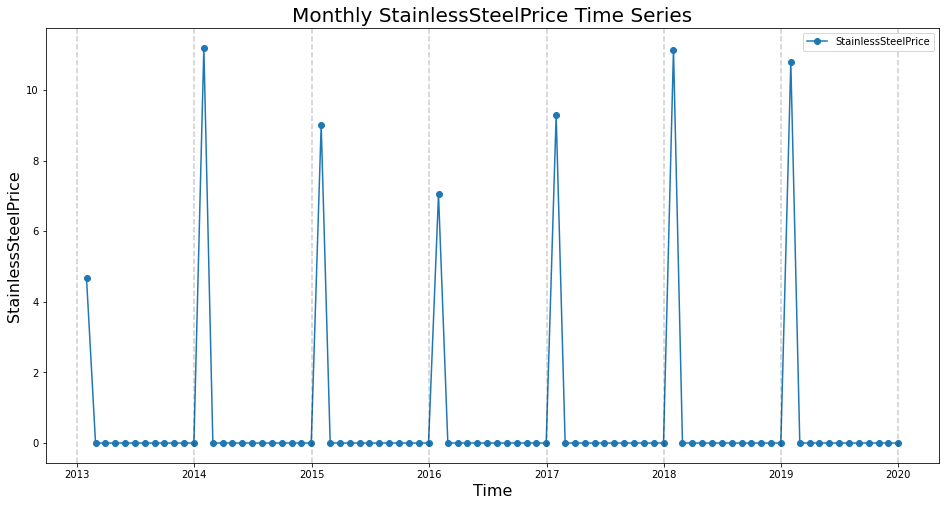

In [32]:
plt.figure(figsize=(16,8))

plt.plot(lim_data_month['StainlessSteelPrice'], "o-", label = 'StainlessSteelPrice')

plt.title('Monthly StainlessSteelPrice Time Series', fontsize=20)
plt.xlabel("Time", fontsize=16)
plt.ylabel("StainlessSteelPrice", fontsize=16)
plt.legend(loc = 'best')

for year in range(start_date.year,end_date.year+1):
   plt.axvline(pd.to_datetime(str(year)+'-01-01'), color='k', linestyle='--', alpha=0.2)

- check for the stationarity of the series by:
    1. Visually inspecting the plot as above.
    2. Advanced test methodologies like Dickey Fuller test as we do below.

In [33]:
# DF Test using statsmodels adfuller
from statsmodels.tsa.stattools import adfuller

def df_test(time_series):
    
    print('Results of Dickey-Fuller Test:')
    dftest = adfuller(time_series, autolag = 'AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic', 'p-value', '#Lags Used', 'Number of Observations Used'])
    
    for key, value in dftest[4].items():
        dfoutput['Critical Value (%s)' %key] = value
    
    print (dfoutput)

In [34]:
#Yearly
df_test(lim_data_year.StainlessSteelPrice)

Results of Dickey-Fuller Test:
Test Statistic                -3.611474
p-value                        0.005545
#Lags Used                     0.000000
Number of Observations Used    6.000000
Critical Value (1%)           -5.354256
Critical Value (5%)           -3.646238
Critical Value (10%)          -2.901198
dtype: float64


- Checking p-value: It should be less than or equal to 0.05
    1. Since here p-value is <0.05, therefore time series is stationary
    2. Hence first difference is not required.

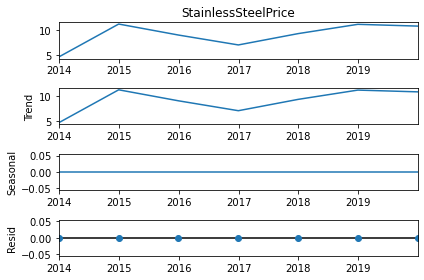

In [35]:
#break time series (yearly) in to trend, seasonality and residuals (noise component) and analyze.
sm.tsa.seasonal_decompose(lim_data_year.StainlessSteelPrice, model='additive').plot()
plt.show()

We see from 2017, there is upward trend and seasonality is constatnt through out and The residuals look is zero (normally distributed)

In [36]:
#Monthly
df_test(lim_data_month.StainlessSteelPrice)

Results of Dickey-Fuller Test:
Test Statistic                 -3.296236
p-value                         0.015048
#Lags Used                     11.000000
Number of Observations Used    72.000000
Critical Value (1%)            -3.524624
Critical Value (5%)            -2.902607
Critical Value (10%)           -2.588679
dtype: float64


Here as well p-value is <0.05, therefore time series is stationary
and Hence first difference is not required.

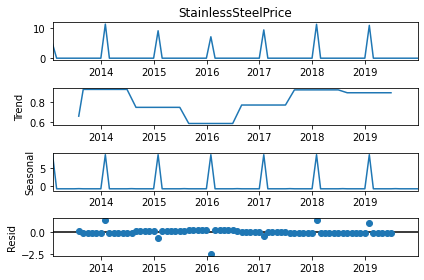

In [37]:
#break time series (monthly) in to trend, seasonality and residuals (noise component) and analyze.
sm.tsa.seasonal_decompose(lim_data_month.StainlessSteelPrice, model='additive').plot()
plt.show()

We see from 2017, there is upward trend and clear seasonality (repeating pattern) in the original time series (monthly) and The residuals look is normally distributed around zero.